In [15]:
# This R environment comes with many helpful analytics packages installed
# It is defined by the kaggle/rstats Docker image: https://github.com/kaggle/docker-rstats
# For example, here's a helpful package to load

library(tidyverse) # metapackage of all tidyverse packages

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

list.files(path = "../input")

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

[1] "housing-price-prediction-data"

In [16]:
# Load necessary libraries
library(ggplot2)
library(plotly)
library(dplyr)

# Read the data
data <- read.csv("/kaggle/input/housing-price-prediction-data/housing_price_dataset.csv")

# Summary of data
summary(data)

   SquareFeet      Bedrooms       Bathrooms     Neighborhood      
 Min.   :1000   Min.   :2.000   Min.   :1.000   Length:50000      
 1st Qu.:1513   1st Qu.:3.000   1st Qu.:1.000   Class :character  
 Median :2007   Median :3.000   Median :2.000   Mode  :character  
 Mean   :2006   Mean   :3.499   Mean   :1.995                     
 3rd Qu.:2506   3rd Qu.:4.000   3rd Qu.:3.000                     
 Max.   :2999   Max.   :5.000   Max.   :3.000                     
   YearBuilt        Price       
 Min.   :1950   Min.   :-36588  
 1st Qu.:1967   1st Qu.:169956  
 Median :1985   Median :225052  
 Mean   :1985   Mean   :224827  
 3rd Qu.:2003   3rd Qu.:279374  
 Max.   :2021   Max.   :492195  

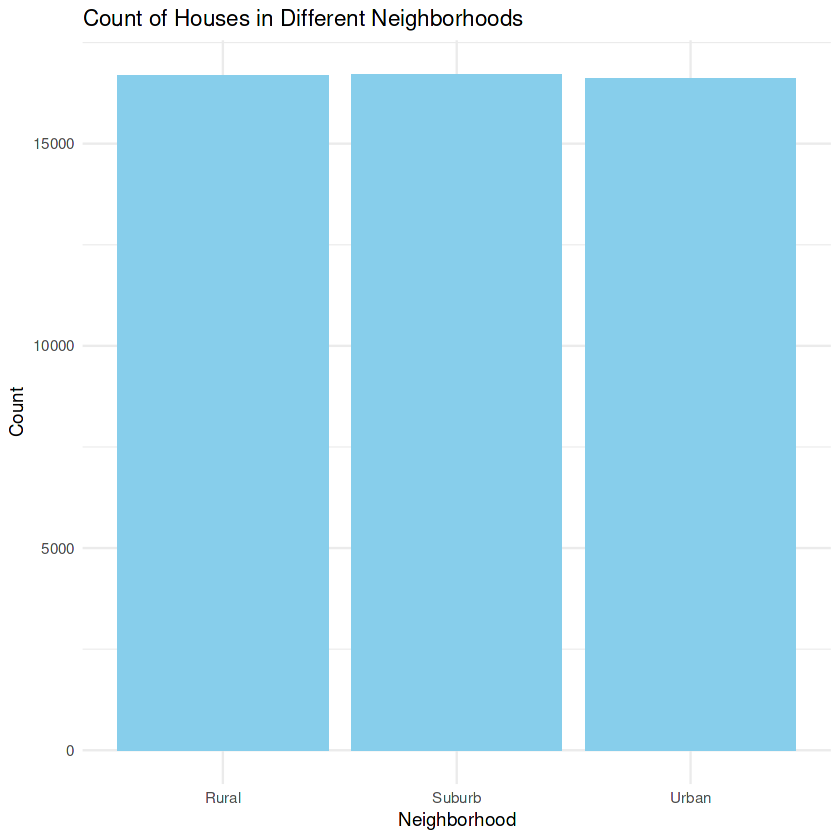

In [17]:
# Word Chart: Bar chart for Neighborhoods
ggplot(data, aes(x = Neighborhood)) +
  geom_bar(fill = "skyblue") +
  labs(title = "Count of Houses in Different Neighborhoods", x = "Neighborhood", y = "Count") +
  theme_minimal()

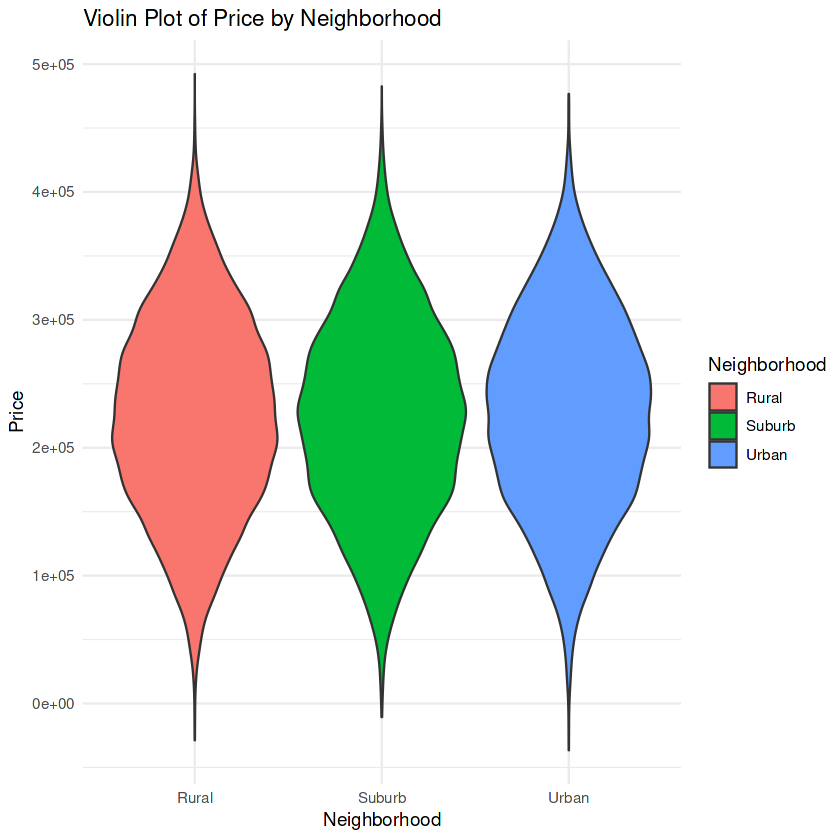

In [18]:
# Violin Plot: Price by Neighborhood
ggplot(data, aes(x = Neighborhood, y = Price, fill = Neighborhood)) +
  geom_violin() +
  labs(title = "Violin Plot of Price by Neighborhood", x = "Neighborhood", y = "Price") +
  theme_minimal()


`geom_smooth()` using formula = 'y ~ x'


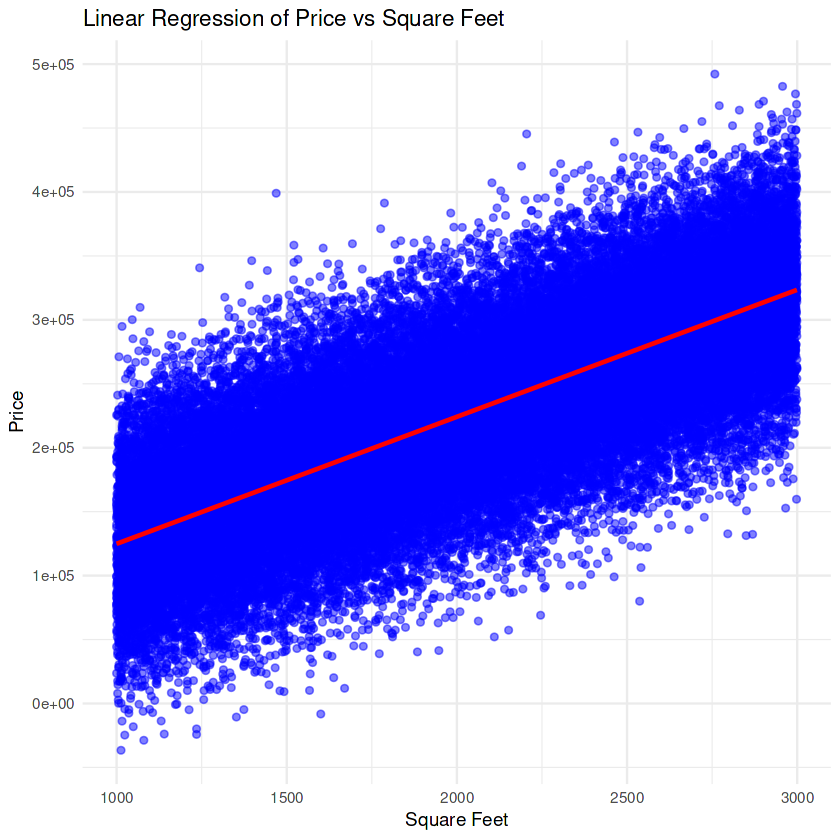

In [19]:
# Linear Regression Plot: Price vs Square Feet
ggplot(data, aes(x = SquareFeet, y = Price)) +
  geom_point(color = "blue", alpha = 0.5) +
  geom_smooth(method = "lm", color = "red") +
  labs(title = "Linear Regression of Price vs Square Feet", x = "Square Feet", y = "Price") +
  theme_minimal()


`geom_smooth()` using formula = 'y ~ x'
Warning message:
“Failed to fit group -1.
Caused by error in `predLoess()`:
! workspace required (3750537550) is too large probably because of setting 'se = TRUE'.”


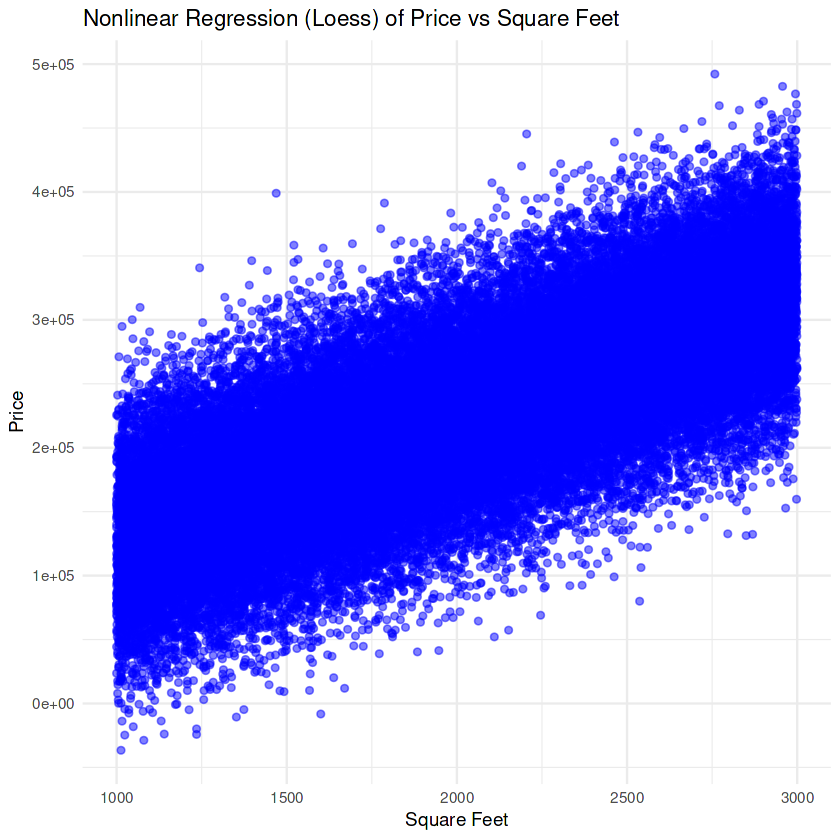

In [20]:
# Nonlinear Regression Plot: Price vs Square Feet with Loess
ggplot(data, aes(x = SquareFeet, y = Price)) +
  geom_point(color = "blue", alpha = 0.5) +
  geom_smooth(method = "loess", color = "purple") +
  labs(title = "Nonlinear Regression (Loess) of Price vs Square Feet", x = "Square Feet", y = "Price") +
  theme_minimal()


In [21]:
# 3D Scatter Plot: Price, Square Feet, and Year Built
plot_ly(data, x = ~SquareFeet, y = ~YearBuilt, z = ~Price, type = "scatter3d", mode = "markers",
        marker = list(size = 5, color = ~Price, colorscale = 'Viridis', showscale = TRUE)) %>%
  layout(scene = list(xaxis = list(title = 'Square Feet'),
                      yaxis = list(title = 'Year Built'),
                      zaxis = list(title = 'Price')),
         title = '3D Scatter Plot of Price, Square Feet, and Year Built')


HTML widgets cannot be represented in plain text (need html)

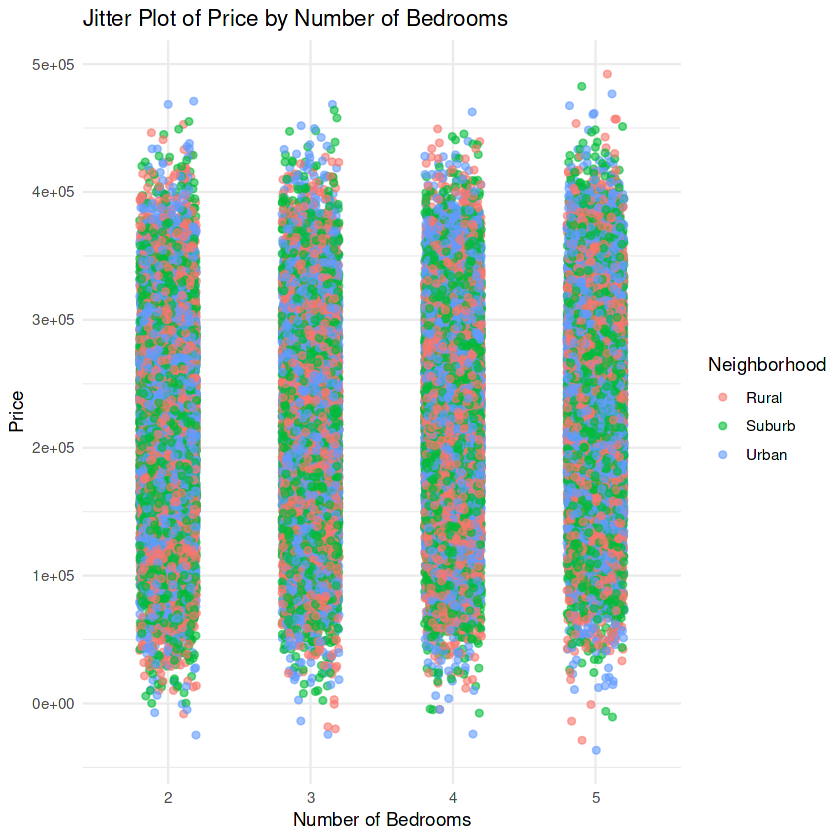

In [22]:
# Jitter Plot: Price by Number of Bedrooms with Neighborhood Jitter
ggplot(data, aes(x = as.factor(Bedrooms), y = Price, color = Neighborhood)) +
  geom_jitter(width = 0.2, alpha = 0.6) +
  labs(title = "Jitter Plot of Price by Number of Bedrooms", x = "Number of Bedrooms", y = "Price") +
  theme_minimal()
